In [ ]:
! conda install -c plotly/label/test plotly

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

import folium
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import math
import random
from datetime import timedelta
import warnings
warnings.filterwarnings('ignore')
import cufflinks as cf
cf.go_offline()

In [ ]:
import seaborn as sns
from datetime import datetime, timedelta,date
import plotly.express as px
from statsmodels.tsa.arima_model import ARIMA
#color pallette
cnf = '#393e46'
dth = '#ff2e63'
rec = '#21bf73'
act = '#fe9801'

import plotly as py



In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/Covid-19-Preprocessed-Dataset/master/preprocessed/covid_19_data_cleaned.csv', parse_dates=['Date'])
country_daywise = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/Covid-19-Preprocessed-Dataset/master/preprocessed/country_daywise.csv', parse_dates=['Date'])
countywise = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/Covid-19-Preprocessed-Dataset/master/preprocessed/countrywise.csv')
daywise = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/Covid-19-Preprocessed-Dataset/master/preprocessed/daywise.csv', parse_dates=['Date'])


In [ ]:
df['Province/State']=df['Province/State'].fillna("")
df['Date'] = df['Date'].astype(str)

In [ ]:
fig=px.density_mapbox(df, lat='Lat',lon='Long',hover_name='Country',hover_data = ['Confirmed','Recovered','Deaths'],animation_frame='Date',color_continuous_scale='Portland',radius = 7,zoom = 0,height = 700)
fig.update_layout(title='worldwide covid')
fig.update_layout(mapbox_style='open-street-map',mapbox_center_lon=0)
fig.show()

In [11]:
temp=df.groupby('Date')['Confirmed','Recovered','Deaths','Active'].sum().reset_index()
temp=temp.melt(id_vars='Date',value_vars=['Recovered','Deaths','Active'],var_name='case',value_name='count')

fig=px.area(temp,x='Date',y='count',color='case',height=400,title='case overtime',color_discrete_sequence=[rec,dth,act])
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

In [13]:
fig_c = px.bar(daywise, x = 'Date', y = 'Confirmed', color_discrete_sequence = [act])
fig_d = px.bar(daywise, x = 'Date',y = 'No. of Countries', color_discrete_sequence = [dth])

fig = make_subplots(rows = 1, cols = 2, shared_xaxes = False, horizontal_spacing = 0.1,
                    subplot_titles = ('No. of New Cases per Day', 'No. of Countries'))

fig.add_trace(fig_c['data'][0], row = 1, col =1)

fig.add_trace(fig_c['data'][0], row = 1, col =2)

fig.show()

In [14]:
fig = px.bar(country_daywise, x = 'Date', y = 'Confirmed', color = 'Country', height = 600,
             title = 'Confirmed', color_discrete_sequence = px.colors.cyclical.mygbm)

fig.show()

In [15]:
fig = px.bar(country_daywise, x = 'Date', y = 'Deaths', color = 'Country', height = 600,
             title = 'Deaths', color_discrete_sequence = px.colors.cyclical.mygbm)

fig.show()

In [16]:
fig = px.bar(country_daywise, x = 'Date', y = 'Recovered', color = 'Country', height = 600,
             title = 'Recovered', color_discrete_sequence = px.colors.cyclical.mygbm)

fig.show()

In [19]:
gt_100 = country_daywise[country_daywise['Confirmed'] > 100]['Country'].unique()
temp = df[df['Country'].isin(gt_100)]
temp = temp.groupby(['Country','Date'])['Confirmed'].sum().reset_index()

temp = temp[temp['Confirmed'] > 100]


min_date = temp.groupby('Country')['Date'].min().reset_index()
min_date.columns = ['Country','Min Date']


from_100th_case = pd.merge(temp, min_date, on = 'Country')
from_100th_case['N days'] = (from_100th_case['Date'] - from_100th_case['Min Date']).dt.days


fig = px.line(from_100th_case, x = 'N days', y = 'Confirmed', color = 'Country', 
              title = 'N days from 100 case', height = 600)

fig.show()

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [20]:
gt_100000 = country_daywise[country_daywise['Confirmed'] > 100000]['Country'].unique()
temp = df[df['Country'].isin(gt_100000)]
temp = temp.groupby(['Country','Date'])['Confirmed'].sum().reset_index()

temp = temp[temp['Confirmed'] > 100000]


min_date = temp.groupby('Country')['Date'].min().reset_index()
min_date.columns = ['Country','Min Date']


from_100000th_case = pd.merge(temp, min_date, on = 'Country')
from_100000th_case['N days'] = (from_100000th_case['Date'] - from_100000th_case['Min Date']).dt.days


fig = px.line(from_100000th_case, x = 'N days', y = 'Confirmed', color = 'Country', 
              title = 'N days from 100000 case', height = 600)

fig.show()

TypeError: unsupported operand type(s) for -: 'str' and 'str'

In [21]:
full_latest = df[df['Date'] == max(df['Date'])]

fig = px.treemap(full_latest.sort_values(by = 'Confirmed', ascending = False).reset_index(drop = True), 
                 path = ['Country', 'Province/State'], values = 'Confirmed', height = 700,
                 title = 'Number of Confirmed Cases', color_discrete_sequence = px.colors.qualitative.Dark2)

fig.data[0].textinfo = 'label+text+value'

fig.show()

In [22]:
full_latest = df[df['Date'] == max(df['Date'])]

fig = px.treemap(full_latest.sort_values(by = 'Deaths', ascending = False).reset_index(drop = True), 
                 path = ['Country', 'Province/State'], values = 'Deaths', height = 700,
                 title = 'Number of Deaths Cases', color_discrete_sequence = px.colors.qualitative.Dark2)

fig.data[0].textinfo = 'label+text+value'

fig.show()

In [28]:
df_age = pd.read_csv("https://raw.githubusercontent.com/rohitgupta29/AI7-/master/India_data/AgeGroupDetails.csv",index_col = 0)
df_india = pd.read_csv("https://raw.githubusercontent.com/rohitgupta29/AI7-/master/India_data/covid_19_india.csv",index_col= 0)
df_tests = pd.read_csv("https://raw.githubusercontent.com/rohitgupta29/AI7-/master/India_data/StatewiseTestingDetails.csv")
df_hosp = pd.read_csv('https://raw.githubusercontent.com/rohitgupta29/AI7-/master/India_data/HospitalBedsIndia.csv',index_col=0)
df_pop = pd.read_csv('https://raw.githubusercontent.com/rohitgupta29/AI7-/master/India_data/population_india_census2011.csv',index_col= 0)
df_labs = pd.read_csv('https://raw.githubusercontent.com/rohitgupta29/AI7-/master/India_data/ICMRTestingLabs.csv')

In [29]:
df_india.drop(df_india[df_india['State/UnionTerritory'] == 'Telangana***'].index,inplace = True)
df_india.drop(df_india[df_india['State/UnionTerritory'] == 'Telengana***'].index,inplace = True)
df_india.drop(df_india[df_india['State/UnionTerritory'] == 'Telengana'].index,inplace = True)
df_india.drop(df_india[df_india['State/UnionTerritory'] == 'Unassigned'].index,inplace = True)

In [30]:
df_india['Date'] = pd.to_datetime(df_india['Date'],dayfirst=True)
df_india['Date'] = df_india['Date'].dt.strftime('%m/%d/%Y')

#Dropping Negative column as we already have 'TotalSamples' and 'Positive'

df_tests.drop('Negative',axis =1 ,inplace = True)
df_pop.set_index('State / Union Territory',inplace = True)

In [31]:
#Filling in Missing Data

#For missing 'Positive' cases of COVID, the previous known value is filled in.
df_tests['Positive'].fillna(method='ffill',inplace = True)

#For missing 'Sub-District Hospitals' values, assumed 0 hospitals are present in state.
df_hosp.fillna(0,inplace = True)

In [32]:

state_report = df_india.groupby(by = 'State/UnionTerritory').max().reset_index()

state_report['Active'] = (state_report['Confirmed'] - (state_report['Cured'] + state_report['Deaths']))
state_report['Deaths per 100 Cases'] = round(((state_report['Deaths']/state_report['Confirmed'])*100),2)

state_report.drop(columns = ['Time' , 'ConfirmedIndianNational' , 'ConfirmedForeignNational'],inplace = True)

state_report.style.background_gradient(cmap = 'Greens',subset= ['Cured'])\
                    .background_gradient(cmap = 'Reds',subset= ['Deaths'])\
                    .background_gradient(cmap = 'Blues',subset= ['Confirmed'])\
                    .background_gradient(cmap = 'Greys',subset= ['Active'])\
                    .background_gradient(cmap = 'Reds',subset =
                                         ['Deaths per 100 Cases']).format('{:.2f}', subset = ['Deaths per 100 Cases'])

,State/UnionTerritory,Date,Cured,Deaths,Confirmed,Active,Deaths per 100 Cases
0,Andaman and Nicobar Islands,08/12/2020,829,21,1900,1050,1.11
1,Andhra Pradesh,08/12/2020,161425,2296,254146,90425,0.90
2,Arunachal Pradesh,08/12/2020,1659,3,2430,768,0.12
3,Assam,08/12/2020,47209,161,68999,21629,0.23
4,Bihar,08/12/2020,59786,416,90321,30119,0.46
5,Cases being reassigned to states,07/18/2020,0,0,9265,9265,0.00
6,Chandigarh,08/12/2020,1023,26,1751,702,1.48
7,Chhattisgarh,08/12/2020,9508,109,13498,3881,0.81
8,Dadar Nagar Haveli,06/11/2020,2,0,26,24,0.00
9,Dadra and Nagar Haveli and Daman and Diu,08/12/2020,1248,2,1696,446,0.12


In [33]:
#State latitudes and longitudes found using geopy

Location_dict = {'Andaman and Nicobar Islands': (10.2188344, 92.5771329),
 'Andhra Pradesh': (15.9240905, 80.1863809),
 'Arunachal Pradesh': (27.6891712, 96.4597226),
 'Assam': (26.4073841, 93.2551303),
 'Bihar': (25.6440845, 85.906508),
 'Chandigarh': (30.7334421, 76.7797143),
 'Chhattisgarh': (21.6637359, 81.8406351),
 'Daman & Diu': (20.42000485, 72.86376290300566),
 'Delhi': (28.6517178, 77.2219388),
 'Goa': (15.3004543, 74.0855134),
 'Gujarat': (22.41540825, 72.03149703699282),
 'Haryana': (29.0, 76.0),
 'Himachal Pradesh': (31.81676015, 77.34932051968858),
 'Jammu and Kashmir': (33.5574473, 75.06152),
 'Jharkhand': (23.4559809, 85.2557301),
 'Karnataka': (14.5203896, 75.7223521),
 'Kerala': (10.3528744, 76.5120396),
 'Ladakh': (33.9456407, 77.6568576),
 'Madhya Pradesh': (23.9699282, 79.39486954625225),
 'Maharashtra': (19.531932, 76.0554568),
 'Manipur': (24.7208818, 93.9229386),
 'Meghalaya': (25.5379432, 91.2999102),
 'Mizoram': (23.2146169, 92.8687612),
 'Nagaland': (26.1630556, 94.5884911),
 'Odisha': (20.5431241, 84.6897321),
 'Puducherry': (11.9340568, 79.8306447),
 'Punjab': (30.9293211, 75.5004841),
 'Rajasthan': (26.8105777, 73.7684549),
 'Sikkim': (27.601029, 88.45413638680145),
 'Tamil Nadu': (10.9094334, 78.3665347),
 'Telangana': (17.8495919, 79.1151663),
 'Telengana': (17.329125, 78.5822228),
 'Tripura': (23.7750823, 91.7025091),
 'Uttar Pradesh': (27.1303344, 80.859666),
 'Uttarakhand': (30.091993549999998, 79.32176659343018),
 'West Bengal': (22.9964948, 87.6855882)}

In [34]:
map_states = state_report.drop(index=[5,8,9,36],errors = 'ignore')
map_states.reset_index(inplace = True,drop = True)

india_map = folium.Map(location=[21, 78], zoom_start=5, tiles = 'cartodbpositron',min_zoom = 5, max_zoom = 7,control_scale=True)


for i in range(0,len(map_states)):
    state = map_states['State/UnionTerritory'][i]
    cases = map_states['Confirmed'][i]  
    deaths = map_states['Deaths'][i]
    cured = map_states['Cured'][i]
    
    location = Location_dict[state]
    
    folium.Circle([location[0],location[1]],radius = float(cases * 0.8),color = 'blue',fill_color = 'red',
                  fill = True, 
                  tooltip = "<h5 style = 'text-align:center;font-weight:bold'>"+state+"</h5>"\
                  + "<div style = 'text-align:center;'>" + "<b>"+'Confirmed : '+"</b>"+ str(cases)+"</div>"\
                  + "<div style = 'text-align:center;'>" + "<b>"+'Recovered : '+"</b>"+ str(cured)+"</div>"\
                  + "<div style = 'text-align:center;'>" + "<b>"+'Deaths : '+"</b>"+ str(deaths)+"</div>").add_to(india_map)
    
india_map.save('indiamap.html')
india_map


In [35]:
#X------------------------------------------------------------------------------------------------------------------------------------------------X

temp = state_report.sort_values(by = 'Confirmed',ascending= False)[0:20]
temp.reset_index(inplace = True,drop = True)

temp.sort_values(by = 'Confirmed',ascending = False)

plt.figure(figsize= (20,15))
fig2 = px.bar(data_frame=temp, x = temp['State/UnionTerritory'], y=temp['Confirmed'],
            color_continuous_scale= px.colors.sequential.Mint, color = 'Confirmed',
            text='Confirmed',template = 'plotly_white',
            labels = {'State/UnionTerritory':'State','Confirmed':'Confirmed Cases '},
            hover_name = 'State/UnionTerritory',
            hover_data = {'Confirmed':True,'State/UnionTerritory':False}, )

fig2.update_layout(title = {
    'text' : 'Top 20 States by Confirmed Cases',
    'y':0.95,
    'x':0.5,
    'xanchor': 'center',
    'yanchor': 'top'},
    xaxis_title = '')

fig2.update_traces(texttemplate = '%{text:.2s}',textposition = 'outside',textfont_size =13)


fig2.show()

<Figure size 1440x1080 with 0 Axes>

In [36]:
def changetoint(column):
    for i,v in enumerate(column):
        n = ''
        n = n.join([x for x in v if x.isdigit()])
        
        return int(n)

df_hosp['NumPrimaryHealthCenters_HMIS'] = df_hosp['NumPrimaryHealthCenters_HMIS'].apply(changetoint)

df_hosp.drop(index = df_hosp.index[df_hosp['State/UT'] == 'All India'],inplace = True)
#Taking a look at lab data.
sunburst_data = df_labs[['type','state']]
px.sunburst(sunburst_data,path = ['type','state'],color = 'type',
            
           color_discrete_sequence = px.colors.qualitative.Pastel,height = 750,width = 750,template = 'ggplot2',title='Available Research Facilities in State based on Lab Type')

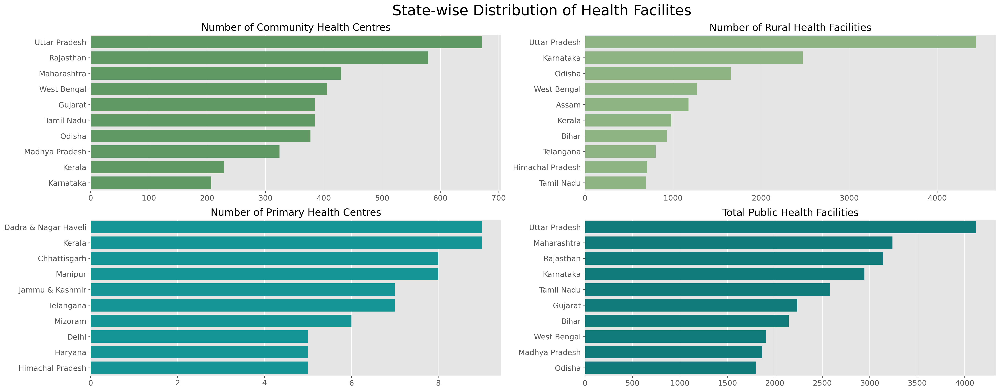

In [37]:

top_community_hosp = df_hosp.nlargest(10,'NumCommunityHealthCenters_HMIS')
top_primary_hosp = df_hosp.nlargest(10,'NumPrimaryHealthCenters_HMIS')
top_rural_hosp = df_hosp.nlargest(10,'NumRuralHospitals_NHP18')
total_hosp =  df_hosp.nlargest(10,'TotalPublicHealthFacilities_HMIS')

plt.figure(figsize = (20,10),dpi = 200)
plt.style.use(u'ggplot')

plt.subplot(2,2,1)

sns.barplot(y = top_community_hosp['State/UT'], x = top_community_hosp['NumCommunityHealthCenters_HMIS'],data= df_hosp,
            orient = 'h' , color = '#58A25D')
plt.xlabel('')
plt.ylabel("")
plt.title('Number of Community Health Centres',fontsize = 17)
plt.tick_params(labelsize = 13)


plt.subplot(2,2,2)

sns.barplot(y = top_rural_hosp['State/UT'], x = top_rural_hosp['NumRuralHospitals_NHP18'],data= df_hosp,
            orient = 'h' , color = '#8ABC7C')
plt.xlabel('')
plt.ylabel("")
plt.title('Number of Rural Health Facilities',fontsize = 17)
plt.tick_params(labelsize = 13)


plt.subplot(2,2,3)

sns.barplot(y = top_primary_hosp['State/UT'], x = top_primary_hosp['NumPrimaryHealthCenters_HMIS'],data= df_hosp,
            orient = 'h' , color = '#00AAAA')
plt.xlabel('')
plt.ylabel("")
plt.title('Number of Primary Health Centres',fontsize = 17)
plt.tick_params(labelsize = 13)


plt.subplot(2,2,4)

sns.barplot(y = total_hosp['State/UT'], x = total_hosp['TotalPublicHealthFacilities_HMIS'],data= df_hosp,
            orient = 'h' , color = '#008B8B')

plt.xlabel('')
plt.ylabel("")
plt.title('Total Public Health Facilities',fontsize = 17)
plt.tick_params(labelsize = 13)

plt.suptitle('State-wise Distribution of Health Facilites',fontsize = 25,x = 0.65)
plt.tight_layout(rect=[0, 0.05, 1.2, 0.95])

In [38]:
latest_tests = df_tests.groupby('State').max().sort_values('TotalSamples',ascending = False)[0:20]
latest_tests['Ratio'] = round((latest_tests['Positive']/latest_tests['TotalSamples'])*1000,2)

fig = px.bar(data_frame = latest_tests,
              y  = latest_tests['TotalSamples'],x =  latest_tests['TotalSamples'].index,template = 'ggplot2',text = latest_tests['Ratio'],
              color = latest_tests['Ratio'],color_continuous_scale= px.colors.sequential.Redor,labels = {'x':'State','TotalSamples':'Number of COVID Tests Done',"Ratio":'5Positive Cases for every 1000 tests'},
              height = 600,width  = 1500)

fig.update_layout(title = {
    'text': 'COVID Tests Done vs Positive Cases for Every 1000 tests'
})
fig.update_traces(textposition = 'outside',textfont_size = 13)

In [39]:
df_india['Date'] = pd.to_datetime(df_india['Date'])
recent_dates = df_india[df_india["Date"] > pd.to_datetime('03/10/20')]

current_date = str(recent_dates['Date'].max())
recent_dates['Date'] = recent_dates['Date'].dt.strftime('%Y-%m-%d')

fig = px.bar(recent_dates,x ='State/UnionTerritory',y = 'Confirmed',animation_frame = 'Date',
             template = 'ggplot2',title = 'Confirmed Cases',
             color = 'Confirmed',height = 600,width  = 1500)
fig.update_layout(xaxis={'categoryorder':'total descending'})

In [40]:
df_india['Date'] = pd.to_datetime(df_india['Date'])

latest = df_india[df_india["Date"] > pd.to_datetime('2020-04-01')]

latest2 = latest.groupby('State/UnionTerritory')['Confirmed','Deaths','Cured',"Date"].max().reset_index()

latest2['Active'] = latest2['Confirmed'] - (latest2['Deaths'] - latest2['Cured'])

state_list = list(latest2.sort_values('Active',ascending = False)['State/UnionTerritory'])[0:15]

states_confirmed = {}
states_deaths = {}
states_recovered = {}
states_active = {}
states_dates = {}

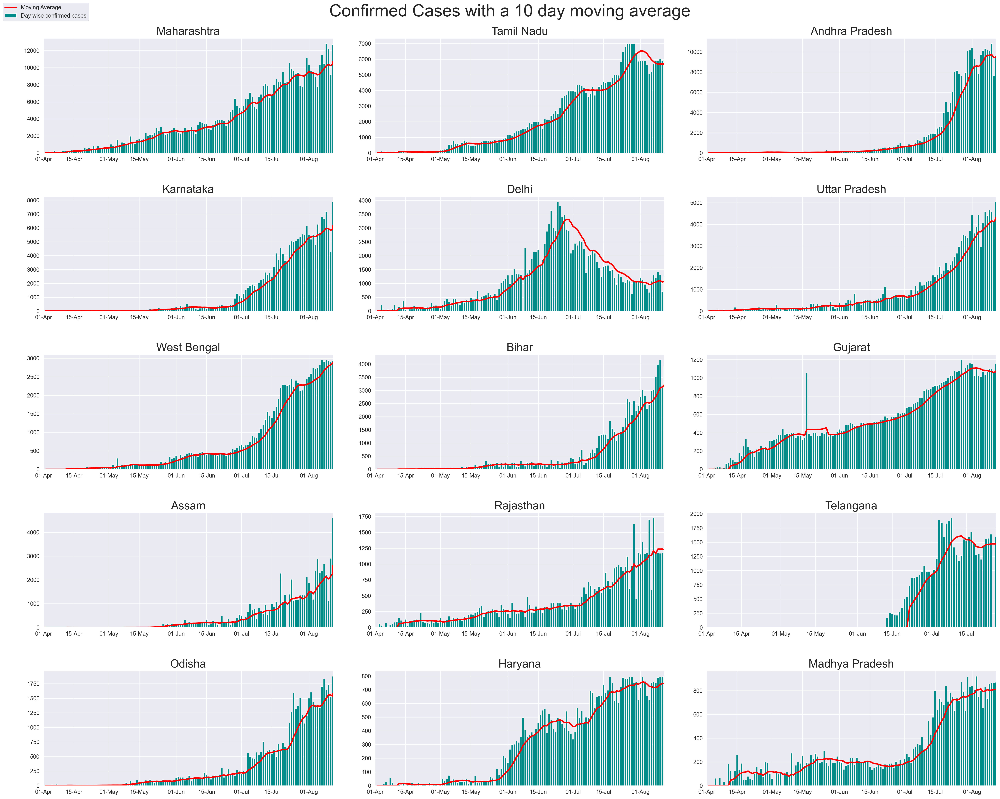

In [41]:
fig = plt.figure(figsize=(25,20),dpi = 250)

import matplotlib.dates as mdates

def movingaverage(values,N):
    cumulativesum = [0]
    movingav = []
    
    for i,x in enumerate(values,1):
        cumulativesum.append(cumulativesum[i-1] + x)
        
        if i >= N:
            movingav.append((cumulativesum[i] - cumulativesum[i-N]) / N)
        else:
            movingav.append(0)
    return movingav


def movingaverage2(values,N):
    cumulativesum = [0]
    movingav = []
    
    for i,x in enumerate(values,0):
        
        if i >= N:
            movingav.append((values[i] - values[i-N]) / N)
        else:
            movingav.append(0)
    return movingav


def percentchange(values):
    
    pctchange = []
    
    for i in range(0,len(values)):
        pastsum = 0
        
        for j in range(i):
            pastsum = pastsum + values[j]
        
        pctchange.append(int((values[i]/pastsum)*100))
        
    return pctchange

axno = 1
sns.set_style('darkgrid')

for state in state_list:
    df1 = latest[latest['State/UnionTerritory'] == state].reset_index(drop = True)

    new_cases = [0]

    state_dates = latest[latest['State/UnionTerritory'] == state]['Date']
    
    for i in range (1,len(df1)):
        cases_delta = (df1['Confirmed'][i] - df1['Confirmed'][i-1])
        new_cases.append(cases_delta)

    df1['New Cases'] = new_cases
    
    
    ax = fig.add_subplot(5,3,axno)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    
    ax.bar(state_dates.values,df1['New Cases'], label = 'Day wise confirmed cases',color = 'darkcyan')
    plt.title(state,fontsize = 20)
    
    moving_aves = movingaverage(df1['New Cases'],10)
    
    moving_aves2 = movingaverage2(df1['Confirmed'],10)
    
    ax.plot(state_dates.values,moving_aves2,color='red',lw = 2.5,label = 'Moving Average')
    plt.xlim(date(2020,4, 1),df1['Date'].max())
    
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper left',)
    axno = axno + 1

plt.suptitle('Confirmed Cases with a 10 day moving average',fontsize = 30,y=1.0)
plt.tight_layout(pad = 4.0)
plt.savefig("State")

In [42]:
fig = px.treemap(df_labs, path=['state','city'],
                  color='city', hover_data=['lab','address'],
                  color_continuous_scale='Purples')
fig.show()

In [45]:
file ="https://raw.githubusercontent.com/rohitgupta29/AI7-/master/COVID%20clinical%20trials.csv"

trials = pd.read_csv(file)
covid_updated = trials.drop(['URL', 'Study Results', 'Study Documents','Results First Posted', 'Last Update Posted', 'Outcome Measures','Study Designs','First Posted','Other IDs'],axis =1)


In [46]:
covid_updated['Phases'].value_counts().drop('Not Applicable').iplot(kind='bar', color='blue',
                                                                    xTitle='Vaccine Phase Types',
                                                                    yTitle='Number of Candidates')